In [110]:
import pandas as pd
import datetime
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
data=pd.read_csv('C://Users//Admin//OneDrive//Desktop//HPE//feature_seln_updated.csv')

In [111]:
data.shape

(2952, 43)

In [112]:
data['START_TIME'] = pd.to_datetime(data['START_TIME'])

In [113]:
df=data[data.columns[1:]].round(4)
df.set_index('START_TIME', inplace=True)

In [114]:
from matplotlib import style
plt.style.use('ggplot')

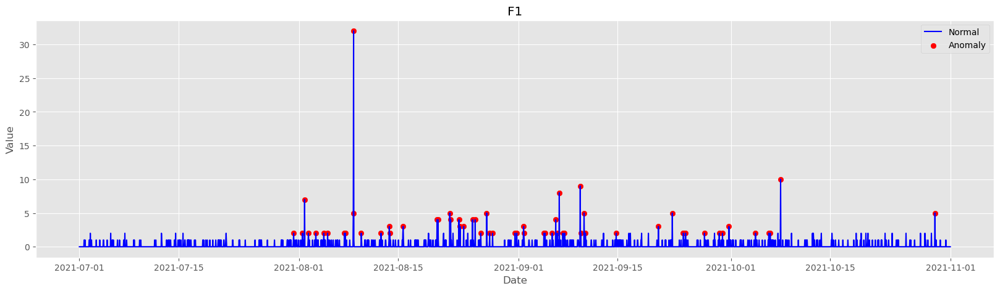

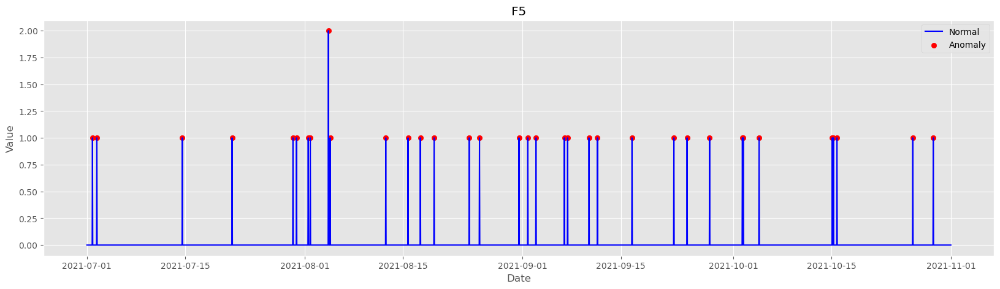

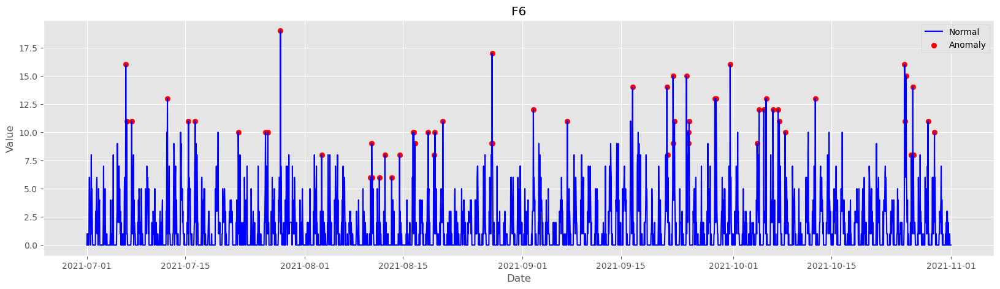

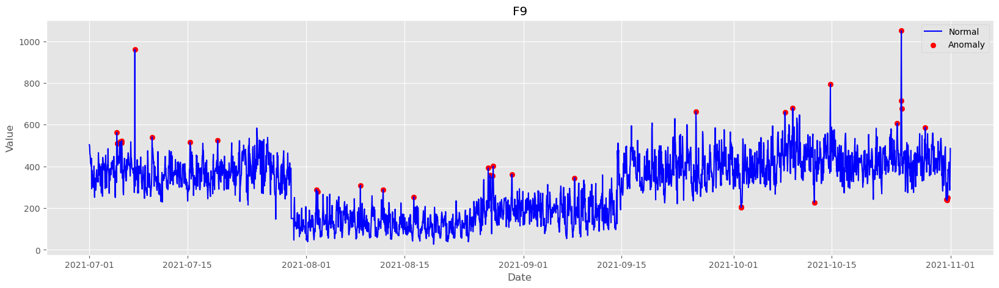

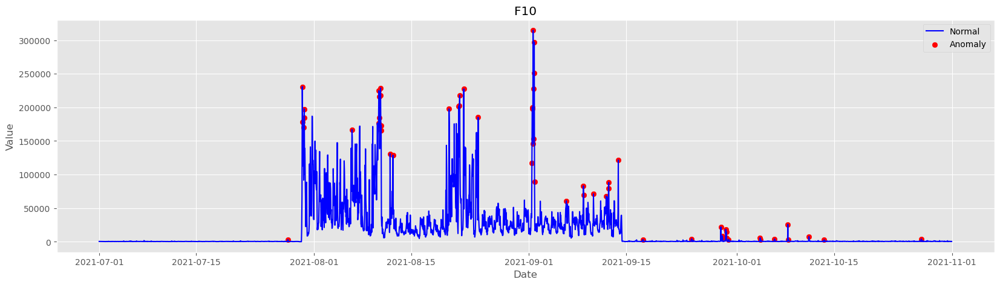

...

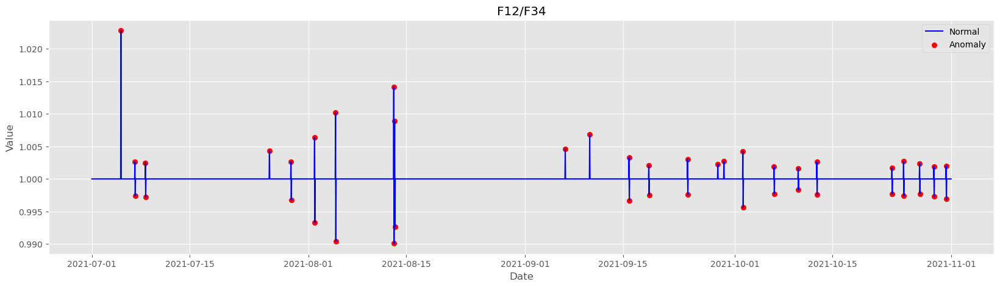

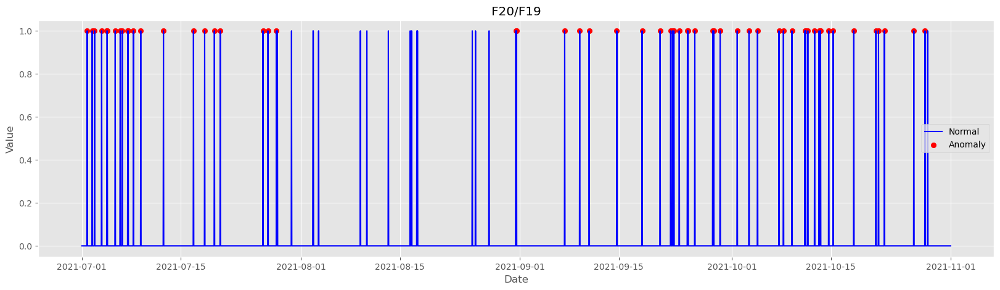

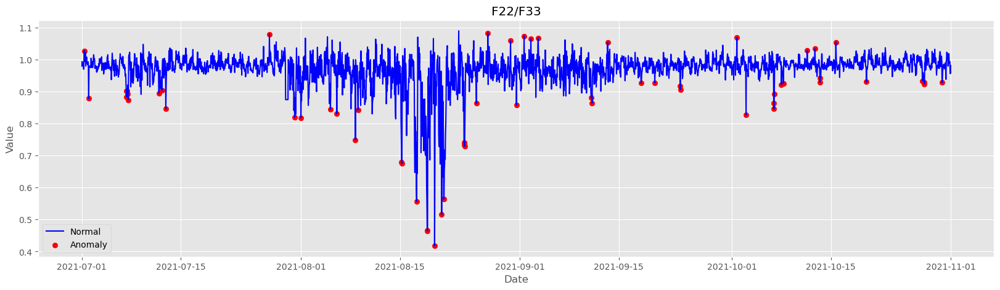

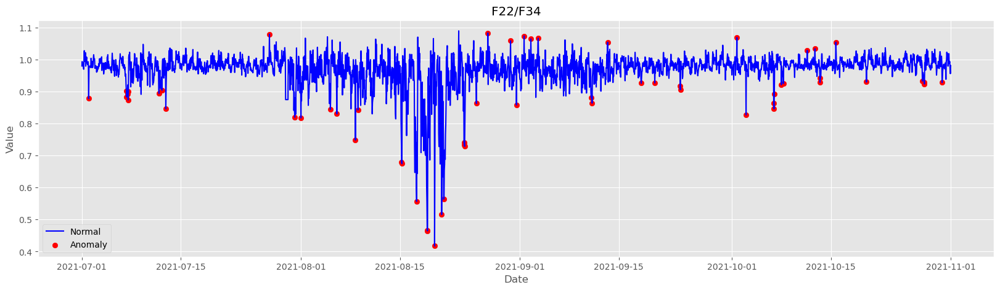

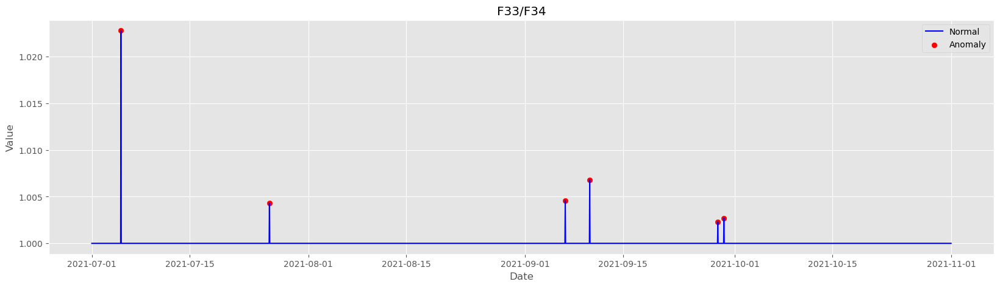

In [115]:
window_size = 168  # size of moving window

for col in df.columns:
    # calculate rolling IQR
    q1 = df[col].rolling(window_size,min_periods=1,center=True,closed='both').quantile(0.25)
    q3 = df[col].rolling(window_size,min_periods=1,center=True,closed='both').quantile(0.75)
    iqr = q3 - q1

    # calculate upper and lower bounds based on the rolling IQR
    lower_bound = (q1 - 1.5 * iqr).round(4)
    upper_bound = (q3 + 1.5 * iqr).round(4)

    # find anomalies
    anomalies = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

    # add lower and upper bound columns to anomalies dataframe
    anomalies.loc[:, 'lower_bound'] = lower_bound
    anomalies.loc[:, 'upper_bound'] = upper_bound

   
    # calculate distance from bound for each anomaly
    anomalies['anomaly_diff'] = np.abs(anomalies[col] - np.where(anomalies[col] < anomalies['lower_bound'], anomalies['lower_bound'], anomalies['upper_bound']))

    # select top n outliers
    top_n = int(np.ceil(len(df) * 2 / 100))
    top_n_outliers = anomalies.sort_values(by='anomaly_diff', ascending=False).head(top_n)

    # plot results
    fig, ax = plt.subplots(figsize=(20,5))
    ax.plot(df.index, df[col], color='blue', label='Normal')
    ax.scatter(top_n_outliers.index, top_n_outliers[col], color='red', label='Anomaly')
    plt.title(col)
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()

    #saving plots
    col_name = col.replace("/", " divided by ")
    plt.savefig(col_name + '_rolling_iqr_plot.png')

    plt.show()


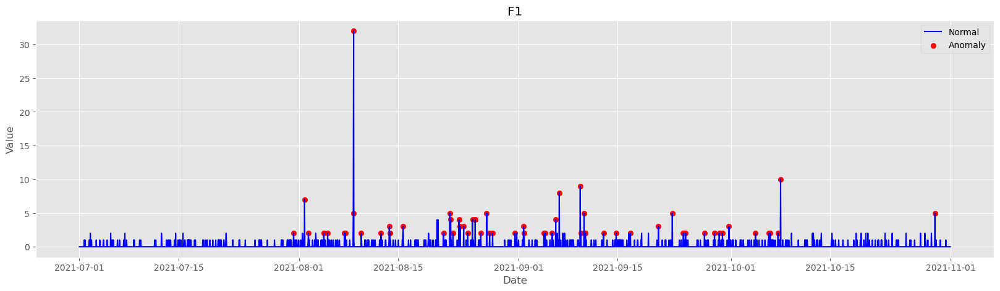

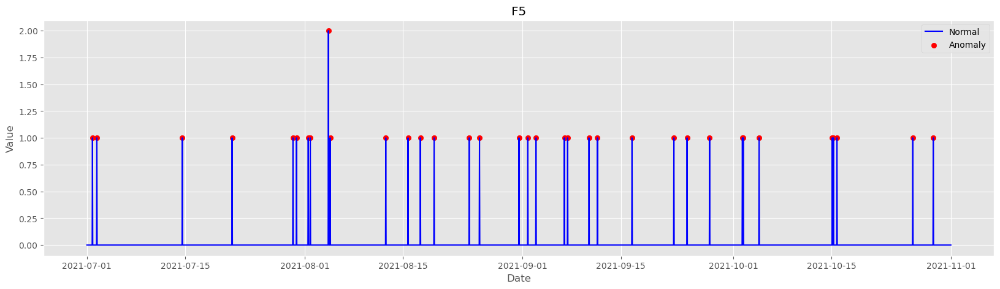

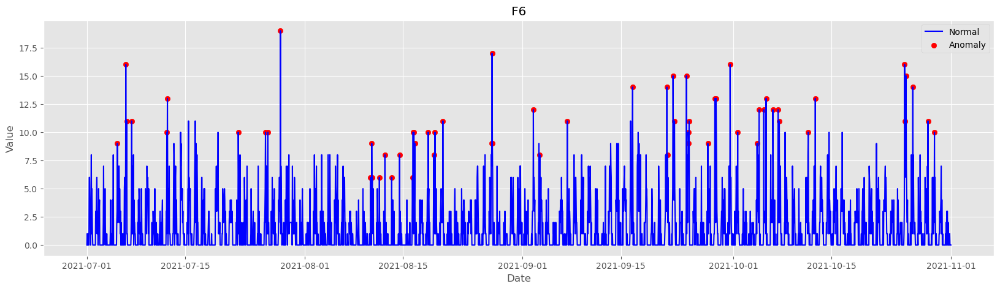

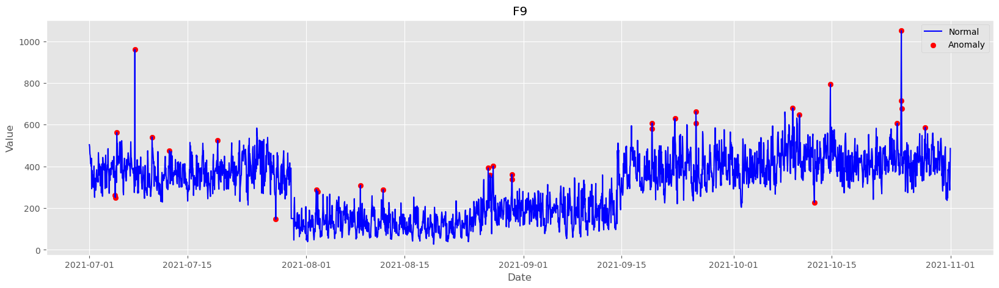

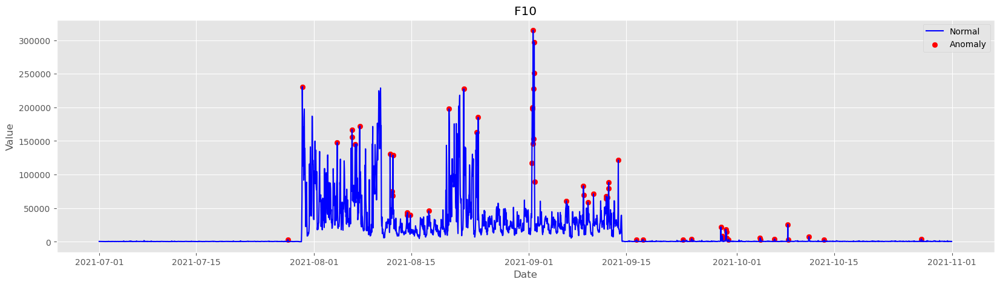

...

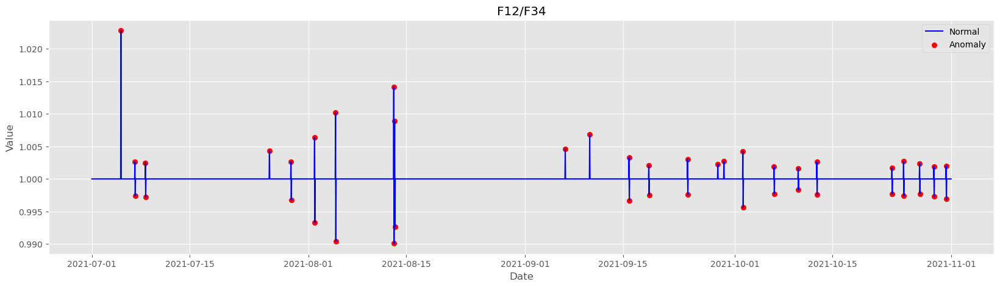

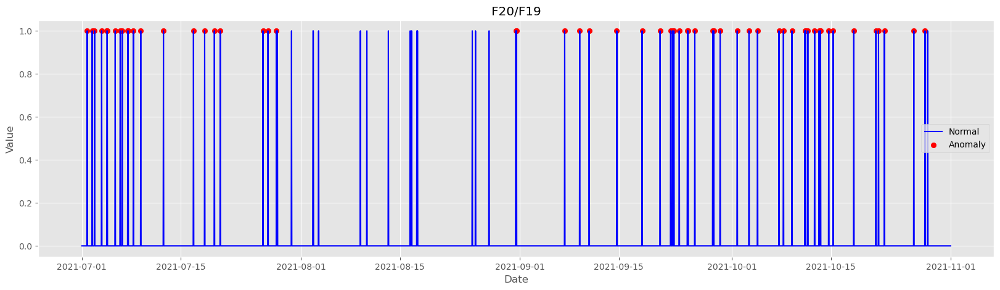

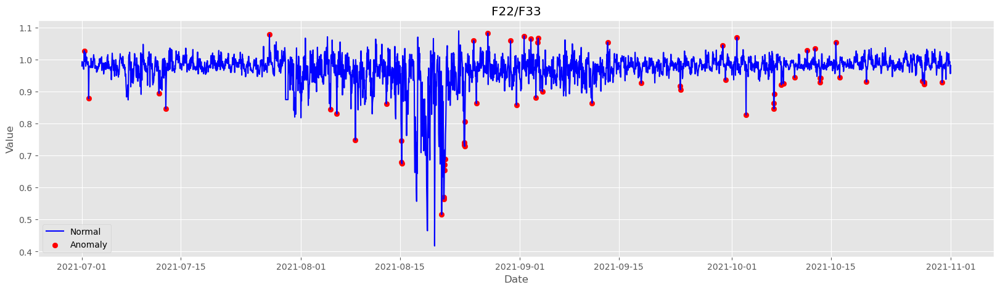

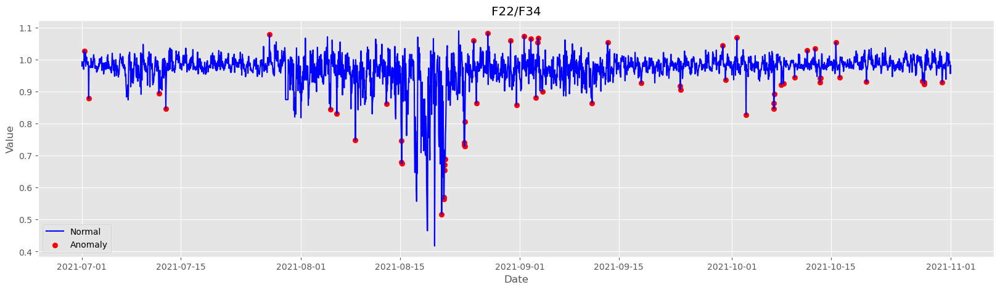

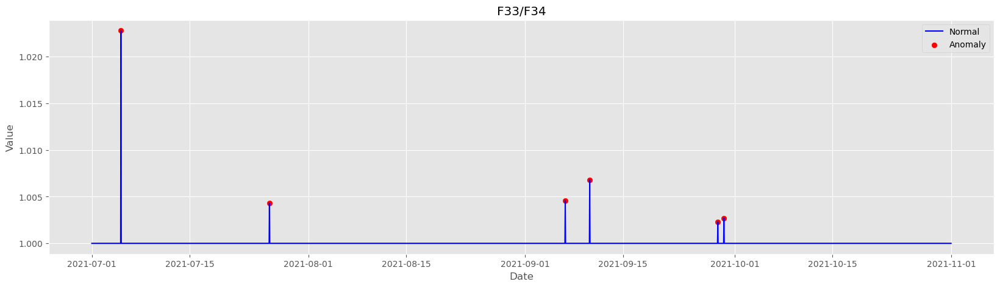

In [116]:
window_size = 96  # size of moving window

for col in df.columns:
    # calculate rolling IQR
    q1 = df[col].rolling(window_size,min_periods=1,center=True,closed='both').quantile(0.25)
    q3 = df[col].rolling(window_size,min_periods=1,center=True,closed='both').quantile(0.75)
    iqr = q3 - q1

    # calculate upper and lower bounds based on the rolling IQR
    lower_bound = (q1 - 1.5 * iqr).round(4)
    upper_bound = (q3 + 1.5 * iqr).round(4)

    # find anomalies
    anomalies = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

    # add lower and upper bound columns to anomalies dataframe
    anomalies.loc[:, 'lower_bound'] = lower_bound
    anomalies.loc[:, 'upper_bound'] = upper_bound

   
    # calculate distance from bound for each anomaly
    anomalies['anomaly_diff'] = np.abs(anomalies[col] - np.where(anomalies[col] < anomalies['lower_bound'], anomalies['lower_bound'], anomalies['upper_bound']))

    # select top n outliers
    top_n = int(np.ceil(len(df) * 2 / 100))
    top_n_outliers = anomalies.sort_values(by='anomaly_diff', ascending=False).head(top_n)

    # plot results
    fig, ax = plt.subplots(figsize=(20,5))
    ax.plot(df.index, df[col], color='blue', label='Normal')
    ax.scatter(top_n_outliers.index, top_n_outliers[col], color='red', label='Anomaly')
    plt.title(col)
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()

    #saving plots
    col_name = col.replace("/", " divided by ")
    plt.savefig(col_name + '_rolling_iqr_plot.png')

    plt.show()


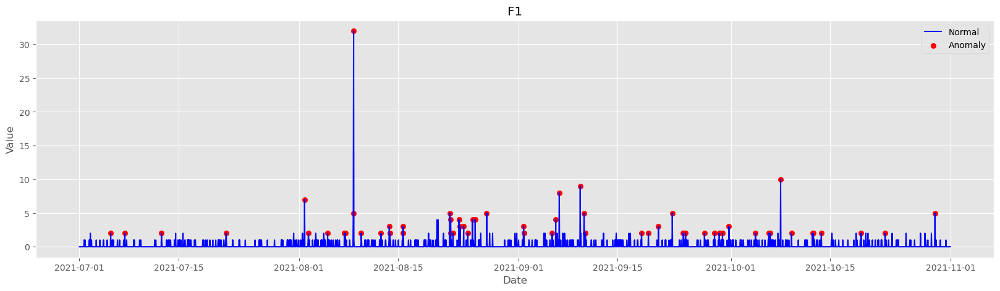

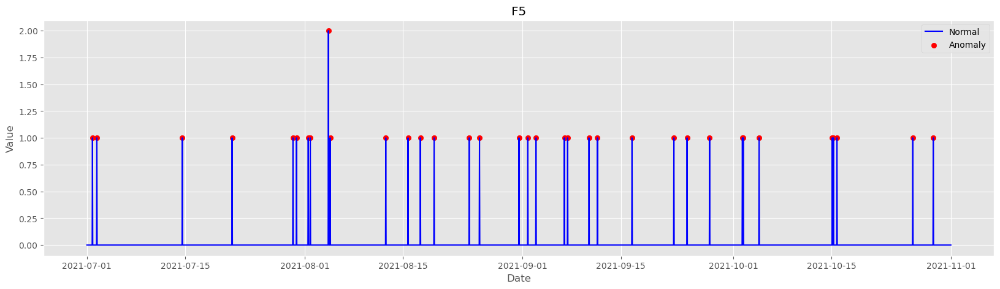

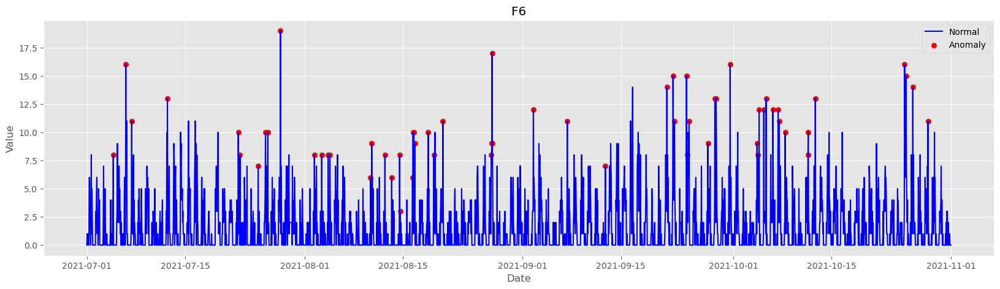

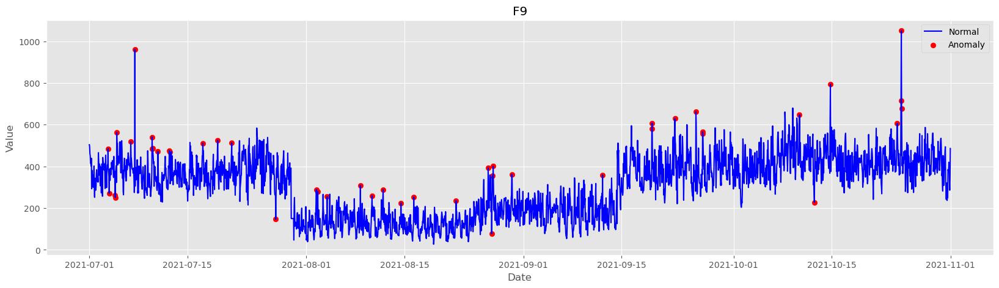

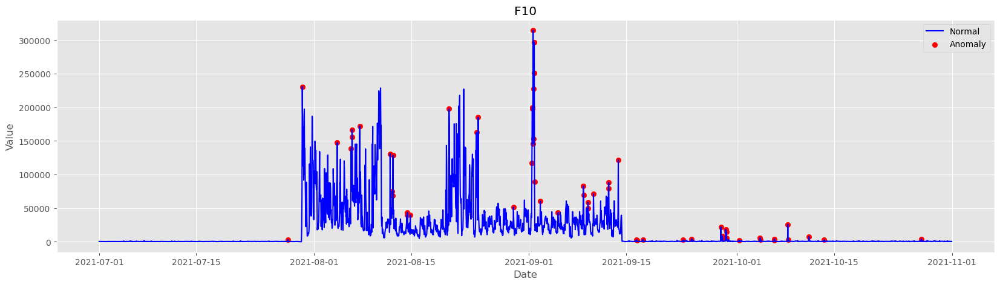

...

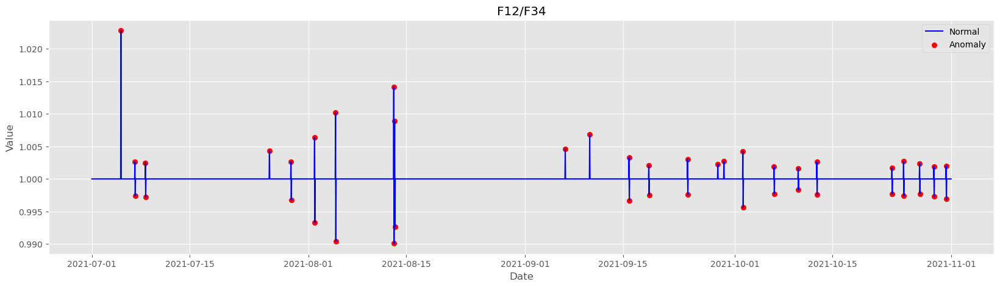

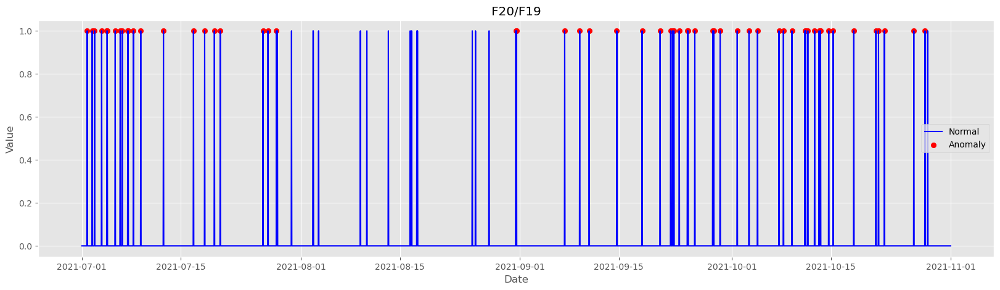

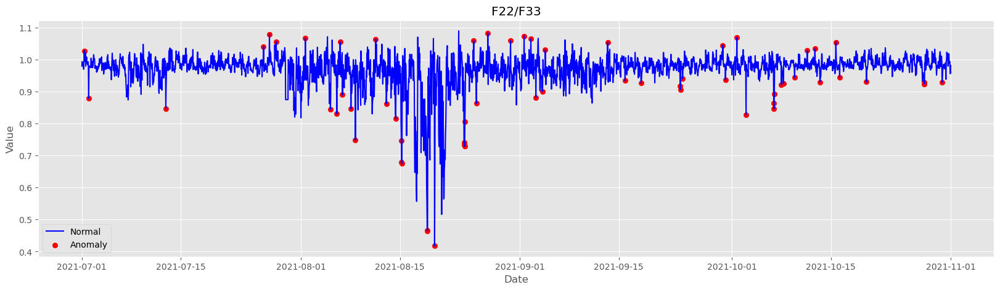

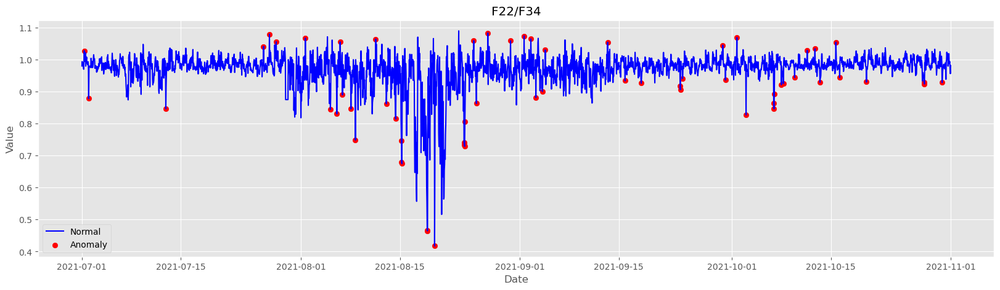

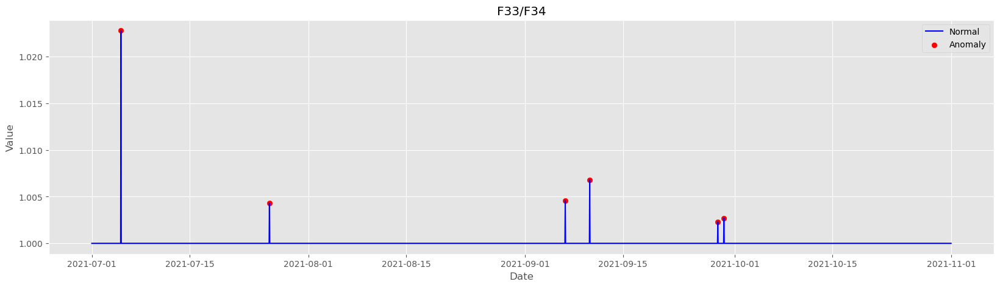

In [117]:
window_size = 60  # size of moving window

for col in df.columns:
    # calculate rolling IQR
    q1 = df[col].rolling(window_size,min_periods=1,center=True,closed='both').quantile(0.25)
    q3 = df[col].rolling(window_size,min_periods=1,center=True,closed='both').quantile(0.75)
    iqr = q3 - q1

    # calculate upper and lower bounds based on the rolling IQR
    lower_bound = (q1 - 1.5 * iqr).round(4)
    upper_bound = (q3 + 1.5 * iqr).round(4)

    # find anomalies
    anomalies = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

    # add lower and upper bound columns to anomalies dataframe
    anomalies.loc[:, 'lower_bound'] = lower_bound
    anomalies.loc[:, 'upper_bound'] = upper_bound

   
    # calculate distance from bound for each anomaly
    anomalies['anomaly_diff'] = np.abs(anomalies[col] - np.where(anomalies[col] < anomalies['lower_bound'], 
                                                                 anomalies['lower_bound'], anomalies['upper_bound']))

    # select top n outliers
    top_n = int(np.ceil(len(df) * 2 / 100))
    top_n_outliers = anomalies.sort_values(by='anomaly_diff', ascending=False).head(top_n)

    # plot results
    fig, ax = plt.subplots(figsize=(20,5))
    ax.plot(df.index, df[col], color='blue', label='Normal')
    ax.scatter(top_n_outliers.index, top_n_outliers[col], color='red', label='Anomaly')
    plt.title(col)
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()

    #saving plots
    col_name = col.replace("/", " divided by ")
    plt.savefig(col_name + '_iqr_plot.png')

    plt.show()



